Where did we left off? What did we just do in PgAdmin? So in PgAdmin, we utlized the "Inner Join" feature to combine seperate tables into one. More importantly though, we did a "Left Join" starting with the "Kpop artist debut dates" table as the origin table and then left joining with the "Official Kpop songs" table. Why? Because the "Kpop artist debut dates" contained boy and girl groups ONLY, no soloists, and I was only interested in songs released from groups. The "official Kpop songs" table had songs from all various artists, including soloists, and so it makes sense to start with the "Kpop artist debut dates" table. 

We then did another left join from the resulting table with the "kpop comeback dates" table in order for the resulting table (that now has the list of korean songs released per group) to have a comeback date assigned to each title track + album track (basically, when was that album released?). 

The "official Kpop songs" table was downloaded from Kaggle, while "Kpop artist debut dates" and "Kpop comeback dates" were made from scratch, using https://dbkpop.com/ . "Kpop artist debut dates" contains the debut dates of each group, while "Kpop comeback dates" contains all the comeback title tracks for each group and when it was released (note: all albums released have a designated title track, one that best represents the group's identity and direction of their music). By combining all of this information into one table, I will be able to perform in-depth analysis regarding the attributes of songs released by groups using python.

Why am I doing this? The "official Kpop songs" table from Kaggle did not have any information on the group itself or when the song itself was released, and one of the things that fasinates me are music trends; how has music changed over time? Are boy groups more likely to release an upbeat title track than a girl group or vice versa? These questions can be answered by joining secondary tables that contain the same track titles but with dates on when they were released, along with tables listing boy and girl groups, their gender, and when they debuted. 

In [841]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
%matplotlib inline

In [842]:
df = pd.read_csv('Kpop pgadmin table.csv')
df.head()

,Artist Name,Artist_Id,Album_Name,Album_Id,Track_Title,Track_Id,danceability,energy,key,loudness,...,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date
0,SECHSKIES,6uRyNreOHUvWPNGnKfIo27,ANOTHER LIGHT,5f2LzIFxljQF4FH7w3rXcQ,SOMETHING SPECIAL,4SCEjymtxVlxswfKrcuoHe,0.717,0.697,11.0,-4.756,...,0.2400,0.0,0.1130,0.529,83.013,199432.0,4.0,M,1997-04-15,2017-09-21
1,SECHSKIES,6uRyNreOHUvWPNGnKfIo27,ANOTHER LIGHT,5f2LzIFxljQF4FH7w3rXcQ,FEELING,53FMFF5eTvBYp8cIifV4qT,0.805,0.899,0.0,-4.141,...,0.0924,0.0,0.0647,0.710,111.979,212251.0,4.0,M,1997-04-15,NaN
2,SECHSKIES,6uRyNreOHUvWPNGnKfIo27,ANOTHER LIGHT,5f2LzIFxljQF4FH7w3rXcQ,SMILE,5yxPaWpRk9lXuBbeYwvr7M,0.666,0.543,10.0,-5.296,...,0.6550,0.0,0.0958,0.338,135.978,228373.0,4.0,M,1997-04-15,2017-09-21
3,SECHSKIES,6uRyNreOHUvWPNGnKfIo27,ANOTHER LIGHT,5f2LzIFxljQF4FH7w3rXcQ,NEED U,0EnvNLJKKrwca0zRdmEVHP,0.683,0.636,10.0,-4.439,...,0.2670,0.0,0.0896,0.689,94.988,221899.0,4.0,M,1997-04-15,NaN
4,SECHSKIES,6uRyNreOHUvWPNGnKfIo27,ANOTHER LIGHT,5f2LzIFxljQF4FH7w3rXcQ,BACKHUG,24OaMVNhHXxX4GEl9jTg9x,0.722,0.651,1.0,-4.715,...,0.3750,0.0,0.4100,0.681,96.981,199794.0,4.0,M,1997-04-15,NaN


Immediately get rid of columns we don't need. Such as Artist_id, ALbum_id, and Track_id. Let's them check to ensure we don't have any missing data.

In [843]:
df = df.drop(columns = ['Artist_Id','Album_Id','Track_Id'])
df.head()

,Artist Name,Album_Name,Track_Title,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date
0,SECHSKIES,ANOTHER LIGHT,SOMETHING SPECIAL,0.717,0.697,11.0,-4.756,1.0,0.0506,0.2400,0.0,0.1130,0.529,83.013,199432.0,4.0,M,1997-04-15,2017-09-21
1,SECHSKIES,ANOTHER LIGHT,FEELING,0.805,0.899,0.0,-4.141,1.0,0.0901,0.0924,0.0,0.0647,0.710,111.979,212251.0,4.0,M,1997-04-15,NaN
2,SECHSKIES,ANOTHER LIGHT,SMILE,0.666,0.543,10.0,-5.296,1.0,0.0360,0.6550,0.0,0.0958,0.338,135.978,228373.0,4.0,M,1997-04-15,2017-09-21
3,SECHSKIES,ANOTHER LIGHT,NEED U,0.683,0.636,10.0,-4.439,1.0,0.0318,0.2670,0.0,0.0896,0.689,94.988,221899.0,4.0,M,1997-04-15,NaN
4,SECHSKIES,ANOTHER LIGHT,BACKHUG,0.722,0.651,1.0,-4.715,1.0,0.0346,0.3750,0.0,0.4100,0.681,96.981,199794.0,4.0,M,1997-04-15,NaN


In [844]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6678 entries, 0 to 6677
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist Name       6678 non-null   object 
 1   Album_Name        6678 non-null   object 
 2   Track_Title       6678 non-null   object 
 3   danceability      6676 non-null   float64
 4   energy            6676 non-null   float64
 5   key               6676 non-null   float64
 6   loudness          6676 non-null   float64
 7   mode              6676 non-null   float64
 8   speechiness       6676 non-null   float64
 9   acousticness      6676 non-null   float64
 10  instrumentalness  6676 non-null   float64
 11  liveness          6676 non-null   float64
 12  valence           6676 non-null   float64
 13  tempo             6676 non-null   float64
 14  duration          6676 non-null   float64
 15  time_signature    6676 non-null   float64
 16  Gender            6678 non-null   object 


It makes sense "comeback date" has null values, because rows with that null value means that that song assigned is NOT a title track. This can help us later on if we're trying to analyze title tracks only through the command .dropna(). Immediately I notice that 2 rows of data are missing data from columns 3-15. We'll have to get rid of those rows.

In [845]:
null_data = df[df['energy'].isnull()]
null_data

,Artist Name,Album_Name,Track_Title,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date
23,SECHSKIES,2016 Re-ALBUM,COME TO ME BABY (2016),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,1997-04-15,NaN
4923,BTOB,24/7 (TWENTY FOUR/SEVEN),Beyond the time,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,2012-03-21,NaN


In [846]:
df = df.drop([23,4923],axis=0)

Lets see which kpop groups are in our table and the number of songs they have! Make a chart showing the amount of times the artist and their songs appears in the table.

In [847]:
df['Artist Name'].nunique()

54

In [848]:
df['Artist Name'].value_counts().head(10)

CNBLUE          523
Super Junior    515
TVXQ            397
BIGBANG         396
SHINee          384
iKON            365
EXO             317
BTS             260
WINNER          249
Shinhwa         240
Name: Artist Name, dtype: int64

Before we dive into the data further, I took a quick glance at the data and saw that some of the albums in the dataframe are not actual albums, but rather recordings of concerts. I do NOT want that, they are just the same songs from released but were recorded during a concert. Let's remove those. Pinpoint the album columns, then delete those rows containing those albums that have specific keywords like Tour or Concert. I also don't want to see albums that are in chinese or Japanese (they are just duplicates of korean songs that have already been released). 

In [849]:
df = df[~df.Album_Name.str.contains('TOUR')]
df = df[~df.Album_Name.str.contains('CONCERT')]
df = df[~df.Album_Name.str.contains('CHINESE')]
df = df[~df.Album_Name.str.contains('JAPANESE')]
df = df[~df.Album_Name.str.contains('LIVE')]
df = df[~df.Track_Title.str.contains('REMIX')]
df = df[~df.Track_Title.str.contains('VERSION')]
df = df[~df.Album_Name.str.contains('Tour')]
df = df[~df.Album_Name.str.contains('Concert')]
df = df[~df.Album_Name.str.contains('Chinese')]
df = df[~df.Album_Name.str.contains('Japanese')]
df = df[~df.Album_Name.str.contains('Live')]
df = df[~df.Track_Title.str.contains('Remix')]
df = df[~df.Track_Title.str.contains('Version')]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4453 entries, 0 to 6677
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist Name       4453 non-null   object 
 1   Album_Name        4453 non-null   object 
 2   Track_Title       4453 non-null   object 
 3   danceability      4453 non-null   float64
 4   energy            4453 non-null   float64
 5   key               4453 non-null   float64
 6   loudness          4453 non-null   float64
 7   mode              4453 non-null   float64
 8   speechiness       4453 non-null   float64
 9   acousticness      4453 non-null   float64
 10  instrumentalness  4453 non-null   float64
 11  liveness          4453 non-null   float64
 12  valence           4453 non-null   float64
 13  tempo             4453 non-null   float64
 14  duration          4453 non-null   float64
 15  time_signature    4453 non-null   float64
 16  Gender            4453 non-null   object 


<AxesSubplot:title={'center':'Most appearances in the dataframe'}, xlabel='Artist Name', ylabel='count'>

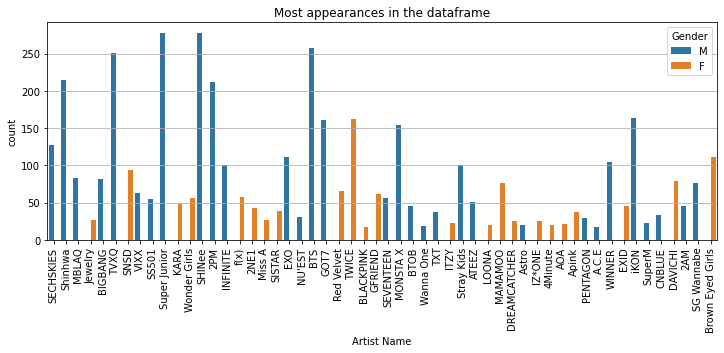

In [850]:
plt.figure(figsize=(12,4))
plt.grid()
plt.title('Most appearances in the dataframe')
plt.xticks(rotation = 'vertical')
sns.countplot(x= df['Artist Name'], hue = df['Gender'])

How many girl groups do we have vs. boy groups and how many songs in this dataframe are released by girl groups vs. boy groups?

<AxesSubplot:title={'center':'Number of Kpop songs in dataframe by gender of the group'}, xlabel='Gender', ylabel='count'>

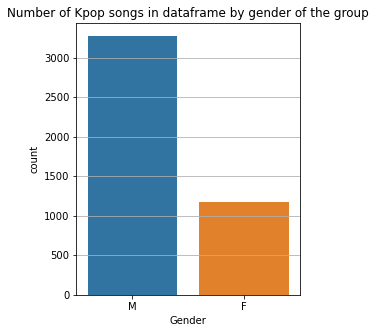

In [852]:
plt.figure(figsize=(4,5))
plt.grid()
plt.title('Number of Kpop songs in dataframe by gender of the group')
sns.countplot(x = df['Gender'])

<AxesSubplot:title={'center':'Number of unique groups in dataframe by gender'}, xlabel='Gender', ylabel='count'>

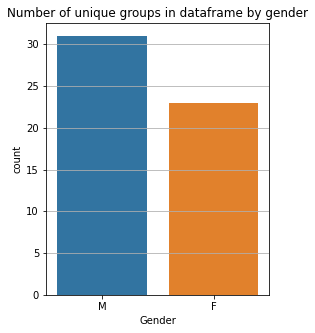

In [853]:
plt.figure(figsize=(4,5))
plt.grid()
plt.title('Number of unique groups in dataframe by gender')
sns.countplot(x= df.drop_duplicates('Artist Name')['Gender'])

Next, can we learn more about our artists, by their year of debut?

Text(0, 0.5, 'frequency')

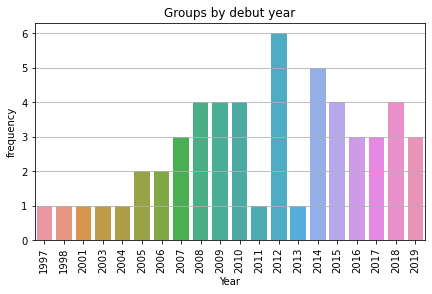

In [854]:
df['Debut Year'] = df.apply(lambda row: row['Debut Date'].split('-',1)[0], axis = 1)
plt.figure(figsize=(7,4))
plt.grid()
plt.xticks(rotation = 'vertical')
plt.title('Groups by debut year')
sns.countplot(x = df.drop_duplicates('Artist Name')['Debut Year'].sort_values())
plt.xlabel('Year')
plt.ylabel('frequency')

Now that we have data regarding the debut year of idol groups, along with the year that the title track songs were released, let's look at some trends! The attributes of a song are displayed below:

In [855]:
df.columns

Index(['Artist Name', 'Album_Name', 'Track_Title', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration',
       'time_signature', 'Gender', 'Debut Date', 'Comeback Date',
       'Debut Year'],
      dtype='object')

In [856]:
df.head()

,Artist Name,Album_Name,Track_Title,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date,Debut Year
0,SECHSKIES,ANOTHER LIGHT,SOMETHING SPECIAL,0.717,0.697,11.0,-4.756,1.0,0.0506,0.2400,0.0,0.1130,0.529,83.013,199432.0,4.0,M,1997-04-15,2017-09-21,1997
1,SECHSKIES,ANOTHER LIGHT,FEELING,0.805,0.899,0.0,-4.141,1.0,0.0901,0.0924,0.0,0.0647,0.710,111.979,212251.0,4.0,M,1997-04-15,NaN,1997
2,SECHSKIES,ANOTHER LIGHT,SMILE,0.666,0.543,10.0,-5.296,1.0,0.0360,0.6550,0.0,0.0958,0.338,135.978,228373.0,4.0,M,1997-04-15,2017-09-21,1997
3,SECHSKIES,ANOTHER LIGHT,NEED U,0.683,0.636,10.0,-4.439,1.0,0.0318,0.2670,0.0,0.0896,0.689,94.988,221899.0,4.0,M,1997-04-15,NaN,1997
4,SECHSKIES,ANOTHER LIGHT,BACKHUG,0.722,0.651,1.0,-4.715,1.0,0.0346,0.3750,0.0,0.4100,0.681,96.981,199794.0,4.0,M,1997-04-15,NaN,1997


For the attribute columns starting from danceability all the way to valence of a song, I'm not sure at all what the units are, or how its being scaled, and so I am more curious about those columns. We can start by using .describe()

In [857]:
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature
count,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000,4453.000000
mean,0.655742,0.762464,5.132495,-4.712775,0.586571,0.084292,0.187704,0.038339,0.194442,0.583789,120.245333,213625.187739,3.978217
std,0.122475,0.165486,3.635388,2.578768,0.492504,0.083509,0.212549,0.170429,0.147389,0.217004,26.072966,39462.311185,0.184098
min,0.073300,0.007920,0.000000,-27.113000,0.000000,0.022000,0.000010,0.000000,0.011900,0.024600,55.494000,25613.000000,1.000000
25%,0.589000,0.676000,1.000000,-5.497000,0.000000,0.039600,0.030600,0.000000,0.093700,0.425000,100.061000,197612.000000,4.000000
50%,0.673000,0.801000,5.000000,-4.275000,1.000000,0.056700,0.104000,0.000000,0.136000,0.601000,120.013000,213867.000000,4.000000
75%,0.740000,0.887000,8.000000,-3.225000,1.000000,0.095000,0.275000,0.000001,0.277000,0.756000,133.825000,233480.000000,4.000000
max,0.972000,0.999000,11.000000,-0.005000,1.000000,0.957000,0.995000,0.960000,0.965000,0.979000,217.180000,400600.000000,5.000000


A majority of the variables are measured from a scale of 0 to 1. Now if we want to plot trends over time, we need to fill out the "comeback date" column entirely, if you want to include both title and album tracks. Currently, only title tracks have a comeback date filled, we would need to correspond that title track to its album name, find all other tracks corresponding to that same album, and then set those tracks to have the same comeback date.

However, heres the thing. Do we want title tracks only to represent the characteristics of that group, or do we want to also include all album tracks, when analyzing trends? In some cases, the album and its corresponding title track are similar in terms of music attributes. Other times, they are not (Dreamcatcher for example). 

How many title tracks do we have in this dataframe? (Title tracks have a comeback date assigned)

In [858]:
df['Comeback Date'].count()

662

Text(0, 0.5, 'Number of title tracks')

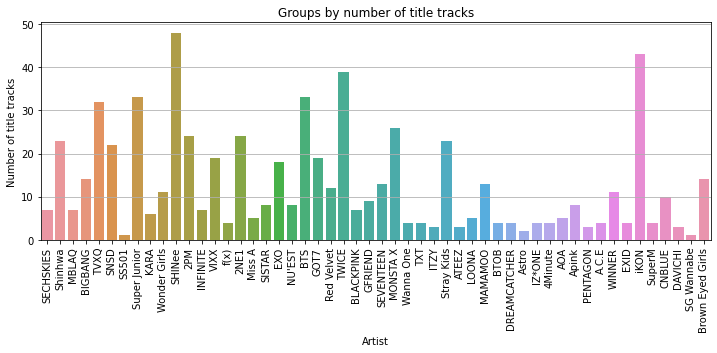

In [859]:
plt.figure(figsize=(12,4))
plt.grid()
plt.xticks(rotation = 'vertical')
plt.title('Groups by number of title tracks')
sns.countplot(x = df.dropna()['Artist Name'])
plt.xlabel('Artist')
plt.ylabel('Number of title tracks')

Some of these artists have too many title tracks...for example iKON has over 40 title tracks, and they only debuted in 2014....based on that info, they should only have about up to 20 title tracks released by now. lets take a closer look at some of them and see why

In [861]:
df.dropna()[df['Artist Name']=='SHINee']

C:\Users\jason\AppData\Local\Temp/ipykernel_6232/1688659519.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.dropna()[df['Artist Name']=='SHINee']


,Artist Name,Album_Name,Track_Title,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date,Debut Year
2101,SHINee,Atlantis - The 7th Album Repackage,Atlantis,0.735,0.847,2.0,-2.689,1.0,0.0681,0.04750,0.000000,0.1220,0.332,110.060,178213.0,4.0,M,2008-05-25,2021-04-12,2008
2103,SHINee,Atlantis - The 7th Album Repackage,Don't Call Me,0.690,0.783,2.0,-2.076,1.0,0.0641,0.01270,0.000000,0.0962,0.306,82.026,220173.0,4.0,M,2008-05-25,2021-02-22,2008
2113,SHINee,Don't Call Me - The 7th Album,Don't Call Me,0.690,0.783,2.0,-2.076,1.0,0.0641,0.01270,0.000000,0.0962,0.306,82.026,220173.0,4.0,M,2008-05-25,2021-02-22,2008
2123,SHINee,The Story of Light' Epilogue - The 6th Album,Countless,0.679,0.829,10.0,-5.166,0.0,0.0720,0.02510,0.000000,0.0680,0.604,97.043,188678.0,4.0,M,2008-05-25,2018-09-10,2008
2124,SHINee,The Story of Light' Epilogue - The 6th Album,Good Evening,0.678,0.809,8.0,-4.162,1.0,0.0598,0.03830,0.000000,0.2430,0.561,119.979,223515.0,4.0,M,2008-05-25,2018-05-28,2008
2128,SHINee,The Story of Light' Epilogue - The 6th Album,Our Page,0.674,0.752,5.0,-4.657,0.0,0.0326,0.29500,0.000000,0.1640,0.348,107.021,239721.0,4.0,M,2008-05-25,2018-06-25,2008
2132,SHINee,The Story of Light' Epilogue - The 6th Album,I Want You,0.719,0.733,4.0,-4.147,1.0,0.0861,0.10100,0.000000,0.2700,0.514,123.058,184798.0,4.0,M,2008-05-25,2018-06-11,2008
2139,SHINee,SHINee THE BEST FROM NOW ON,JULIETTE,0.678,0.912,11.0,-3.196,0.0,0.1020,0.15000,0.000000,0.2030,0.713,109.006,206573.0,4.0,M,2008-05-25,2009-05-25,2008
2140,SHINee,SHINee THE BEST FROM NOW ON,LUCIFER,0.794,0.877,11.0,-3.012,0.0,0.0462,0.02120,0.000000,0.0634,0.864,125.036,235693.0,4.0,M,2008-05-25,2010-06-19,2008
2142,SHINee,SHINee THE BEST FROM NOW ON,Dazzling Girl,0.670,0.903,11.0,-2.629,1.0,0.0364,0.05550,0.000000,0.6970,0.765,129.967,211733.0,4.0,M,2008-05-25,2012-12-25,2008


It now looks like that you have the same title tracks appear because of repackaged albums, where they tend to recycle some of the same tracks from the previous album, including the title track. We need to delete duplicates of title tracks. 

In [862]:
for i in df['Artist Name'].unique():
    df[df['Artist Name']==i] = df[df['Artist Name']==i].drop_duplicates('Track_Title')

Text(0, 0.5, 'Number of title tracks')

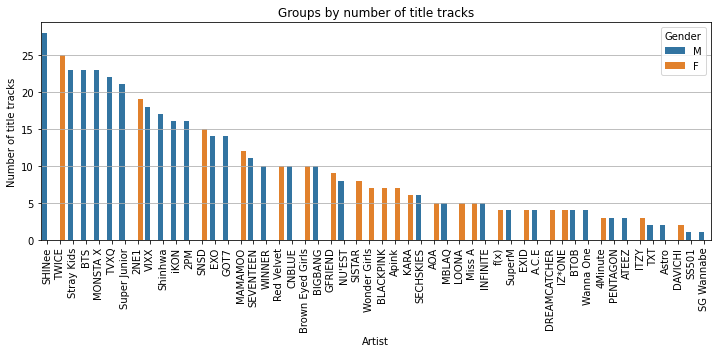

In [863]:
plt.figure(figsize=(12,4))
plt.grid()
plt.xticks(rotation = 'vertical')
plt.title('Groups by number of title tracks')
sns.countplot(x = df.dropna()['Artist Name'], order = df.dropna()['Artist Name'].value_counts(ascending = False).index.values, hue = df['Gender'])
plt.xlabel('Artist')
plt.ylabel('Number of title tracks')

We see here that a majority of the comebacks made so far have been from boy groups. What does this tell us? One, those that debuted the earliest will have more title tracks released. It also says that boy groups are more likely to have long-term success than girl groups; this also means that those with success are more likely to stay as a group for a long period of time and continue releasing new albums.

Lets also look at the number of title tracks released by year. To do this, we will need to create a seperate column containing just the year the title track was released first.

In [865]:
df['Year of track'] = df.dropna().apply(lambda row: row['Comeback Date'].split('-',1)[0], axis = 1)
df['Year of track'] = df['Year of track'].astype(float)

Text(0, 0.5, 'Number of title tracks')

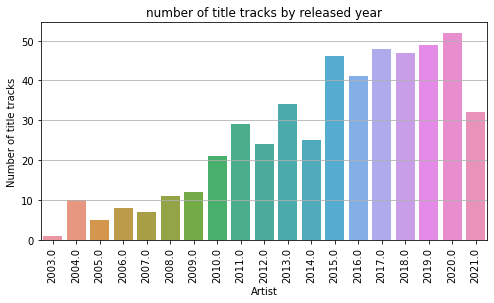

In [867]:
plt.figure(figsize=(8,4))
plt.grid()
plt.xticks(rotation = 'vertical')
plt.title('number of title tracks by released year')
sns.countplot(x = df.dropna()['Year of track'])
plt.xlabel('Artist')
plt.ylabel('Number of title tracks')

To no surprise, there is an increase in the amount of albums released over time. Is this because kpop groups are debuting at a higher frequency than ever, or is it because kpop groups are releasing new albums at a higher frequency than ever? We'll answer this question later, when we create a graph that describes the number of title tracks released per artist year over year. Because the kpop songs spreadsheet was last updated in late 2021, not all the songs at the end of 2021 were added to the spreadsheet, making the year look lower than ususal.

Let's start by answering this question:

-Over time, are title tracks getting more and more upbeat? How do we measure "upbeat" of a song? Let's start with tempo. To make the graph easier to read, let's extract the year out of when the song was released. NOTE that we did previously remove a title track's potential appearence in 2 albums (the first album + a repackaged album a couple of months later), and so should the first album be deleted, there is a rare possbility the track would show up as released a year after if the repackaged album released was in early of the subsequent year. 

0.06473522616560617

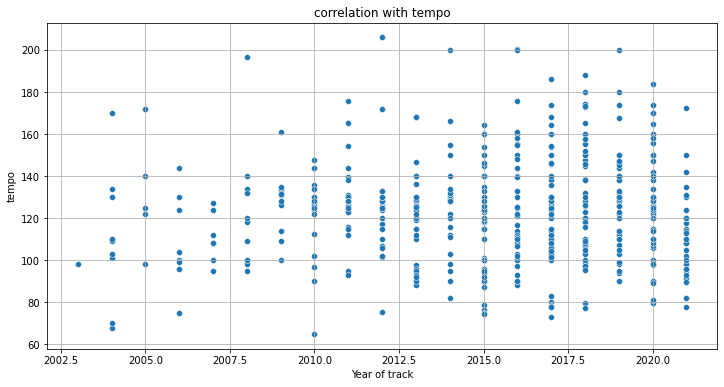

In [868]:
plt.figure(figsize=(12,6))
plt.title('correlation with tempo')
plt.grid()
sns.scatterplot(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['tempo'])
stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['tempo'])[0]

<Figure size 8000x4000 with 0 Axes>

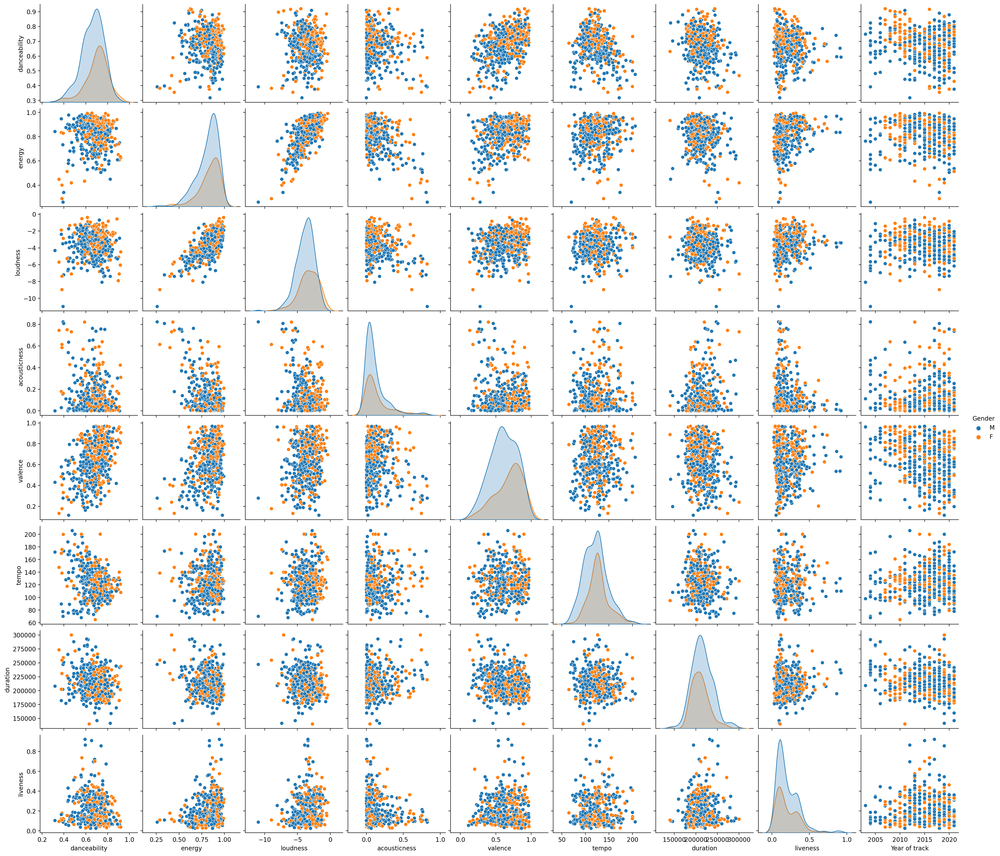

In [870]:
plt.figure(figsize = (40,20))
plt.rcParams['figure.figsize'] = [30, 15]
plt.rcParams['figure.dpi'] = 200
sns.pairplot(df.dropna(), x_vars = ('danceability', 'energy', 'loudness', 'acousticness', 'valence', 'tempo', 'duration', 'liveness', 'Year of track'), y_vars = ('danceability', 'energy', 'loudness', 'acousticness', 'valence', 'tempo', 'duration', 'liveness'), hue = 'Gender')

Looks like there is no change in the tempo of these title tracks. This makes sense, as title tracks have always tried to appeal to the auidence by making it something you can dance to or have a memorable choreography. Very few title tracks are ballads, as not a lot of individual group members have jaw-dropping vocals to back it up. Does tempo best define how "upbeat" a song is though? Let's try other attributes. 

I am assuming "danceability" averages every part in a song to determine this value, and not just the chorus, where it's usually upbeat. This graph then makes a little more sense to me, because more and more title songs released are sounding dynamic and try to be unique, and not all parts in such a song can be danced to (the verses and pre-chorus are often melancholic and melodic than the chorus, which has remained upbeat for example).

Surprisingly, the amount of speech/vocals in a title track is trending upwards over time. I thought the trend would be downwards, given that EDM-structured songs have a lesser duration of vocals than regular songs.

The energy of the song also seems to trend downward. Just like with danceability, more and more songs released may have verses that are melodic and choruses that have a beat drop, therefore reducing the song's average energy throughout.

Seems like songs are getting shorter and shorter over time. 

What positive or negative correlations can we see from this pairplot? Energy and loudness have a positive correlation, danceability and valence have a positive correlation.  

We also included hue to see how the data differs between boy groups and girl groups, let's look at that more closely. The biggest difference I can see here is that girl group songs have a higher valence than boy group songs on average. Valence is a measure of how "happy" a song sounds. 

Now let's compare title tracks to album tracks. I am sure there will be noticeable differences. In order to do this though, the album tracks would also need a comeback year assigned to them. Currently, they are assigned as N/A in order to differentiate them from title tracks. We need to create another column that differentiates a title track from an album track, and then fill the album tracks with a comeback date and a year. 

In [871]:
df['Title Track?'] = np.where(df['Year of track'] > 1900, 'yes', 'no')
for i in range(len(df)-1):
    if df.iloc[i]['Title Track?'] == 'no':
        df.at[i, 'Year of track'] = df.dropna()[df['Album_Name']==df.iloc[i]['Album_Name']].iloc[0]['Year of track']
df.head()

C:\Users\jason\AppData\Local\Temp/ipykernel_6232/2183642765.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.at[i, 'Year of track'] = df.dropna()[df['Album_Name']==df.iloc[i]['Album_Name']].iloc[0]['Year of track']


IndexError: single positional indexer is out-of-bounds

In [872]:
df.dropna()[df['Album_Name']=='BROKEN']

C:\Users\jason\AppData\Local\Temp/ipykernel_6232/3940799437.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.dropna()[df['Album_Name']=='BROKEN']


,Artist Name,Album_Name,Track_Title,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration,time_signature,Gender,Debut Date,Comeback Date,Debut Year,Year of track,Title Track?


It seems that we have a problem. On the "kpop comeback dates" sheet containing the release date of title tracks (same thing as the release date of their corresponding albums), all of the tracks are listed in English. However, on the kpop songs sheet, some of the songs are listed in Korean. Since python cannot translate a korean title to an english one, it just thinks that they are two distinct titles. Unfortunately, fixing this problem will be too much, unless you want to spend the time updating all the title tracks with their english name in the kpop songs sheet. Because of this, the "year of track" vs that certain attribute graph won't change. We can still explore the relationships between two attributes.

Let's further look at the profiles of boy groups and girl groups by the attributes of both their title tracks and album tracks.

<Figure size 8000x4000 with 0 Axes>

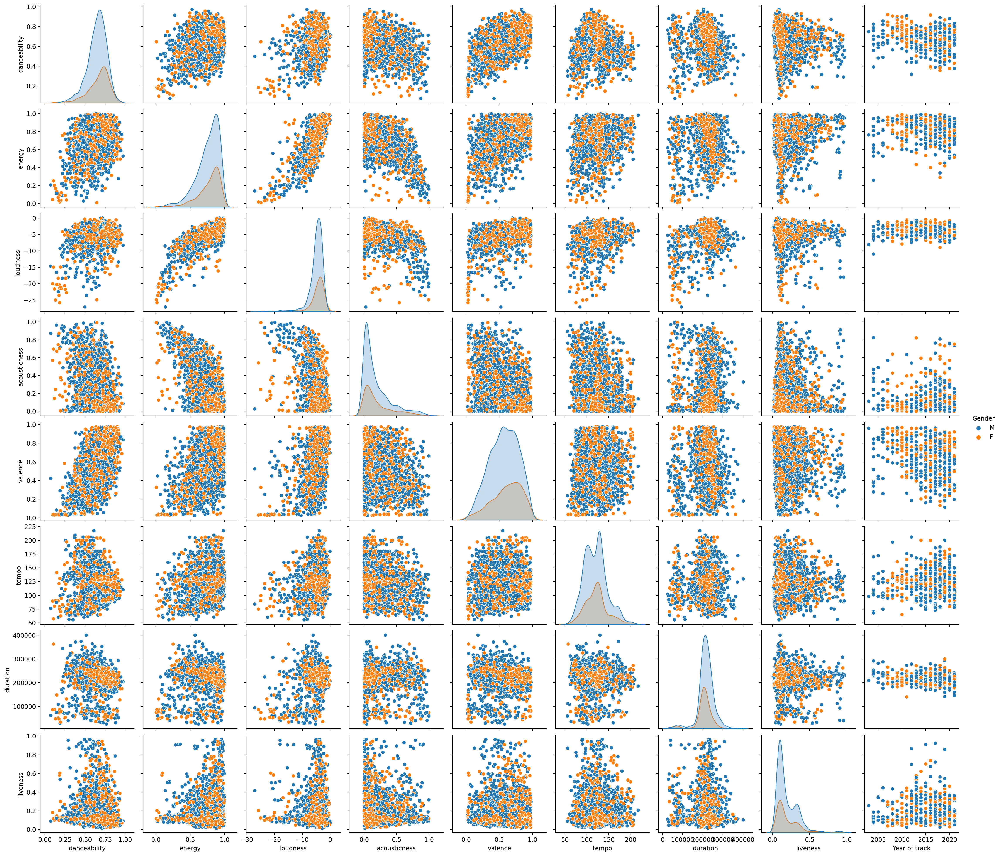

In [874]:
plt.figure(figsize = (40,20))
plt.rcParams['figure.figsize'] = [30, 15]
plt.rcParams['figure.dpi'] = 200
sns.pairplot(df, x_vars = ('danceability', 'energy', 'loudness', 'acousticness', 'valence', 'tempo', 'duration', 'liveness', 'Year of track'), y_vars = ('danceability', 'energy', 'loudness', 'acousticness', 'valence', 'tempo', 'duration', 'liveness'), hue = 'Gender')

Unfortunately the plots between year of track and any of the variables will not show any of the album tracks, as none of the album tracks appear in there, due to the issue mentioned above. However, it is safe to say that kpop groups are more defined and remembered by their title tracks and usually will shape up the identity of the album tracks. SO we can say that title tracks are representative of a kpop group's musical image overall.

Now that we included album tracks here, are there any notable distinctions here?

Energy vs. loudness remains distinct; danceability vs. valence remains distinct; now you can also see that energy and liveness has a positive correlation, while acousticness vs. energy has a negative correlation

Let's get the R-values for each of the "year of track" plots.

In [875]:
print('danceability')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['danceability'])[0])
print('energy')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['energy'])[0])
print('loudness')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['loudness'])[0])
print('acousticness')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['acousticness'])[0])
print('valence')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['valence'])[0])
print('tempo')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['tempo'])[0])
print('duration')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['duration'])[0])
print('liveness')
print(stats.pearsonr(x = df.dropna().sort_values('Comeback Date')['Year of track'], y = df.dropna().sort_values('Comeback Date')['liveness'])[0])

danceability
-0.11944890180536168
energy
-0.026166772864600195
loudness
0.03305676559295939
acousticness
-0.01660049544460481
valence
-0.2209409051541208
tempo
0.06473522616560617
duration
-0.24823293944742403
liveness
0.041663387715950094


The biggest correlation that we see here is that the duration of title tracks have decreased over time. Title tracks are also no longer sounding as happy as before, as song production continues to advance, and are able to capture and interwine with the raw emotions of vocals. Title tracks are also no longer becoming as danceable. 

Let's analyze the danceability and valence profiles by artist.

<AxesSubplot:xlabel='Artist Name', ylabel='danceability'>

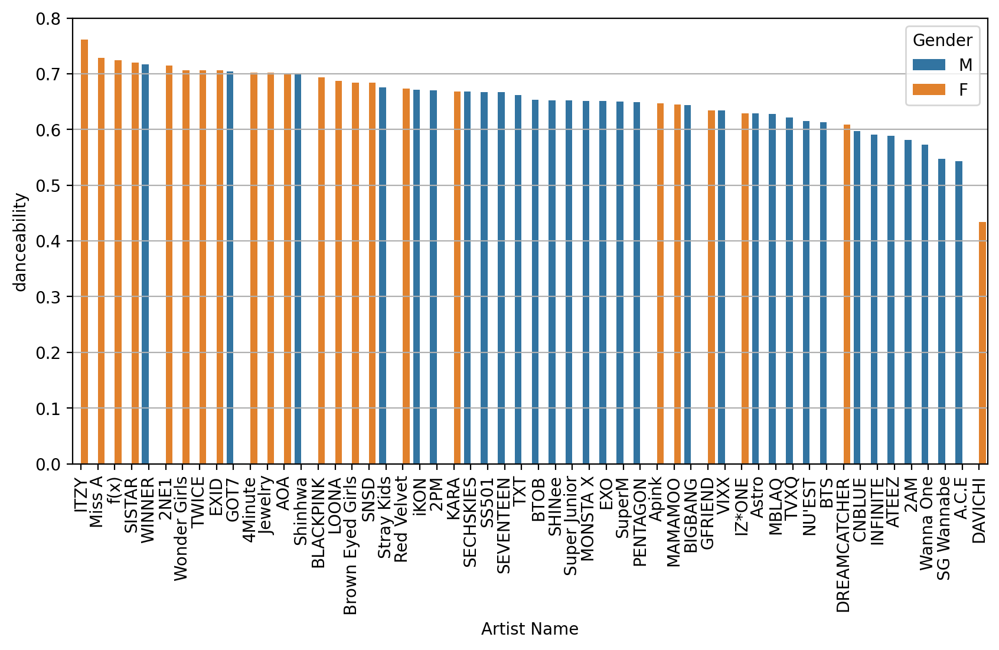

In [876]:
plt.figure(figsize=(10,5))
plt.grid()
plt.xticks(rotation = 'vertical')
sns.barplot(x = df['Artist Name'], y = df['danceability'], order = df.groupby('Artist Name').mean()['danceability'].sort_values(ascending = False).index.values, ci = None, hue = df['Gender'])

<AxesSubplot:xlabel='Artist Name', ylabel='valence'>

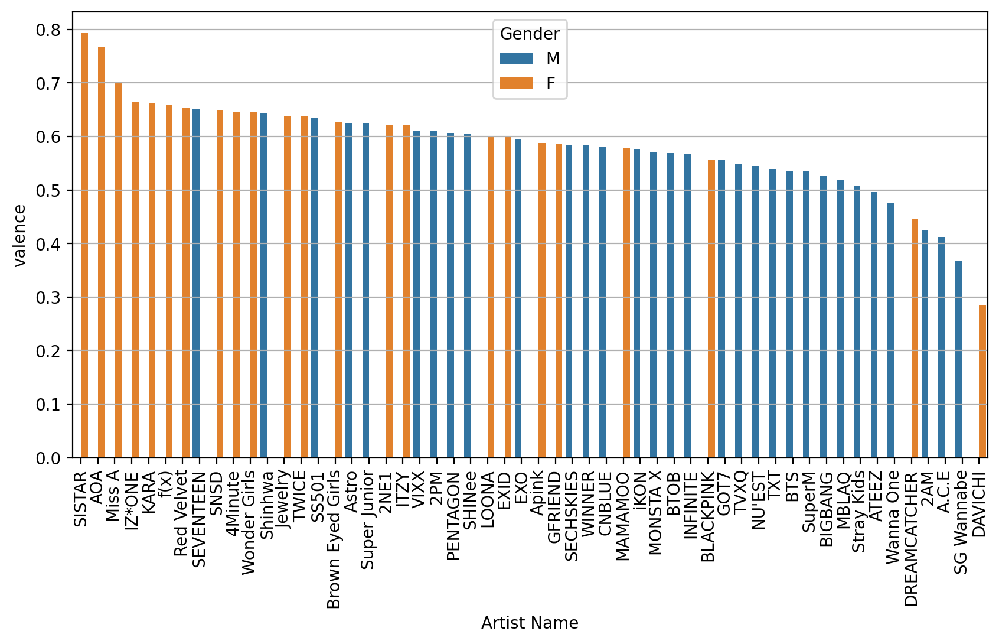

In [877]:
plt.figure(figsize=(10,5))
plt.grid()
plt.xticks(rotation = 'vertical')
sns.barplot(x = df['Artist Name'], y = df['valence'], order = df.groupby('Artist Name').mean()['valence'].sort_values(ascending = False).index.values, ci = None, hue = df['Gender'])

With this data, it is without a doubt that girl groups tend to release tracks that are more upbeat and "happy-sounding" than boy groups. Although it is easy to say that some of the most valent and danceable songs come from the most popular girl groups like AOA and Red Velvet, we also have to remember that the these girl groups also had many title tracks released, thus giving a more accurate representation of who they are in terms of their music. It would not be fair to not say the same thing to the other girl groups who may have not released as many title tracks due to their lack of popularity or a very recent debut (LOONA and ITZY for example). To no surprise, Davichi, a well established group, is at the very bottom of both graphs as they are well known for their ballads.

What other remaining questions do we want to answer? We know that more and more comebacks have been released, and we also know that more and more artists are saturating the Korean pop market, and so that leads us to another question: 
Is the number of albums over time increasing mainly due to an increase in the number of groups debuting or is it due to an increase in the frequency of comebacks during a debut year? We can answer this by plotting the ratio of the number of title tracks released by debuted groups to the number of debuted years by year.

Should we see an positive trend in this ratio year after year, that tells us the frequency of comebacks is greatly increasing. Should we see a neutral trend, that tells us the frequency of debuting groups is greatly increasing.

<AxesSubplot:xlabel='year', ylabel='ratio of # of debuted groups to # of their title tracks'>

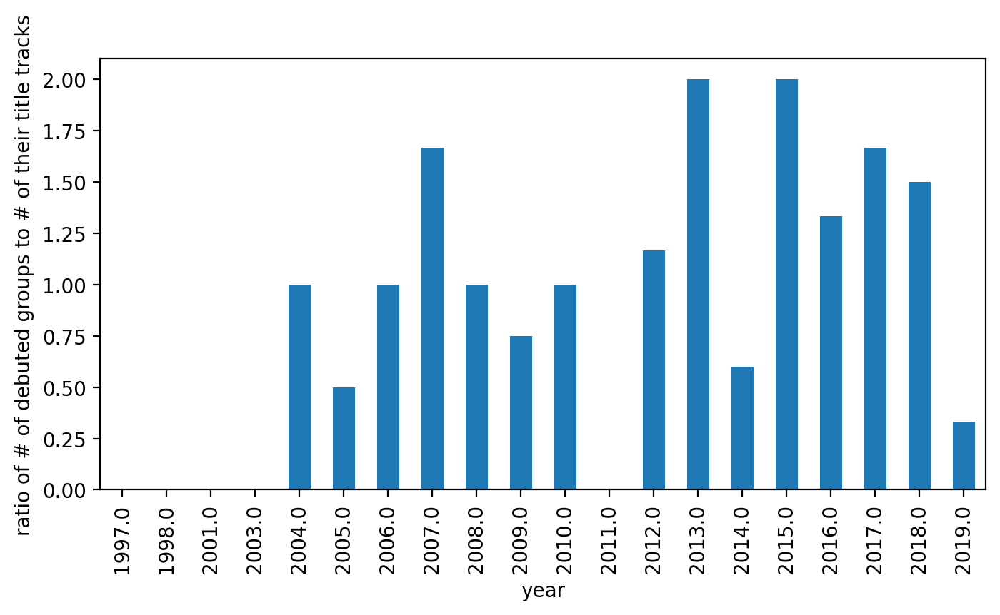

In [890]:
df['Debut Year'] = df['Debut Year'].astype(float)
plt.figure(figsize=(8,4))
plt.grid()
plt.xticks(rotation = 'vertical')
plt.xlabel('year')
plt.ylabel('ratio of # of debuted groups to # of their title tracks')
k = df[df['Year of track']==df['Debut Year']]['Year of track'].value_counts()/df.drop_duplicates('Artist Name')['Debut Year'].value_counts()
k
k.plot.bar()

Looks like there is a slight positive trend, meaning that the increasing frequency in comebacks per artists is the driving factor as to why so many albums are releasing at a higher frequency. However, with a sample size of only about 55 artists, it is still difficult to conclude that. And plus, we know the frequency of groups debuting has also been increasing. Therfore, I would have expected to see a quadratic trend instead, should both variables be true.